# Рынок заведений общественного питания Москвы

В рамках анализа датасета нужно подготовить исследование рынка общественного питания Москвы, найти интересные особенности и презентовать полученные результаты, которые в будущем помогут в выборе подходящего инвесторам места.

## Загрузга данных и изучение общей информации

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import plotly.express as px 
from plotly import graph_objects as go
import seaborn as sns

In [2]:
data = pd.read_csv('/datasets/moscow_places.csv')
data.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0


In [3]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


В датасете представлено 8406 заведений. В столбцах hours, price, avg_bill, middle_avg_bill, middle_coffee_cup и seats наблюдается большое количество пропущенных значений.

## Предобработка данных

In [4]:
data.duplicated().sum()

0

In [5]:
data['name'] = data['name'].str.lower()
data.duplicated(subset = ['name', 'address']).sum()

3

In [6]:
data[data.duplicated(subset = ['name', 'address'], keep = False)]

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
1430,more poke,ресторан,"Москва, Волоколамское шоссе, 11, стр. 2",Северный административный округ,"ежедневно, 09:00–21:00",55.806307,37.497566,4.2,NaN,NaN,NaN,NaN,0,188.0
1511,more poke,ресторан,"Москва, Волоколамское шоссе, 11, стр. 2",Северный административный округ,"пн-чт 09:00–18:00; пт,сб 09:00–21:00; вс 09:00...",55.806307,37.497566,4.2,NaN,NaN,NaN,NaN,1,188.0
2211,раковарня клешни и хвосты,ресторан,"Москва, проспект Мира, 118",Северо-Восточный административный округ,"ежедневно, 12:00–00:00",55.810553,37.638161,4.4,NaN,NaN,NaN,NaN,0,150.0
2420,раковарня клешни и хвосты,"бар,паб","Москва, проспект Мира, 118",Северо-Восточный административный округ,"пн-чт 12:00–00:00; пт,сб 12:00–01:00; вс 12:00...",55.810677,37.638379,4.4,NaN,NaN,NaN,NaN,1,150.0
3091,хлеб да выпечка,булочная,"Москва, Ярцевская улица, 19",Западный административный округ,"ежедневно, 09:00–22:00",55.738886,37.411648,4.1,NaN,NaN,NaN,NaN,1,276.0
3109,хлеб да выпечка,кафе,"Москва, Ярцевская улица, 19",Западный административный округ,NaN,55.738449,37.410937,4.1,NaN,NaN,NaN,NaN,0,276.0


In [7]:
data[data.duplicated(subset = ['name', 'address', 'lat'], keep = False)]

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
1430,more poke,ресторан,"Москва, Волоколамское шоссе, 11, стр. 2",Северный административный округ,"ежедневно, 09:00–21:00",55.806307,37.497566,4.2,NaN,NaN,NaN,NaN,0,188.0
1511,more poke,ресторан,"Москва, Волоколамское шоссе, 11, стр. 2",Северный административный округ,"пн-чт 09:00–18:00; пт,сб 09:00–21:00; вс 09:00...",55.806307,37.497566,4.2,NaN,NaN,NaN,NaN,1,188.0


Следует удалить один неявный дубликат

In [8]:
data.drop_duplicates(subset = ['name', 'address', 'lat'], keep = False, inplace = True)

Пропущенные значения заполнить невозможно из-за недостатка данных, а неразумное заполнение данных может исказить результаты исследования.

In [9]:
data['street'] = data['address'].str.split(',').str[1]
data
#создадим новый столбец с названием улицы, на котрой находится заведение 

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street
0,wowфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN,улица Дыбенко
1,четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0,улица Дыбенко
2,хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0,Клязьминская улица
3,dormouse coffee shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN,улица Маршала Федоренко
4,иль марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0,Правобережная улица
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8401,суши мания,кафе,"Москва, Профсоюзная улица, 56",Юго-Западный административный округ,"ежедневно, 09:00–02:00",55.670021,37.552480,4.4,NaN,NaN,NaN,NaN,0,86.0,Профсоюзная улица
8402,миславнес,кафе,"Москва, Пролетарский проспект, 19, корп. 1",Южный административный округ,"ежедневно, 08:00–22:00",55.640875,37.656553,4.8,NaN,NaN,NaN,NaN,0,150.0,Пролетарский проспект
8403,самовар,кафе,"Москва, Люблинская улица, 112А, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.648859,37.743219,3.9,NaN,Средний счёт:от 150 ₽,150.0,NaN,0,150.0,Люблинская улица
8404,чайхана sabr,кафе,"Москва, Люблинская улица, 112А, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.648849,37.743222,4.2,NaN,NaN,NaN,NaN,1,150.0,Люблинская улица


In [10]:
data['is_24/7'] = data['hours'] == ('ежедневно, круглосуточно')
data

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
0,wowфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN,улица Дыбенко,False
1,четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0,улица Дыбенко,False
2,хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0,Клязьминская улица,False
3,dormouse coffee shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN,улица Маршала Федоренко,False
4,иль марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0,Правобережная улица,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8401,суши мания,кафе,"Москва, Профсоюзная улица, 56",Юго-Западный административный округ,"ежедневно, 09:00–02:00",55.670021,37.552480,4.4,NaN,NaN,NaN,NaN,0,86.0,Профсоюзная улица,False
8402,миславнес,кафе,"Москва, Пролетарский проспект, 19, корп. 1",Южный административный округ,"ежедневно, 08:00–22:00",55.640875,37.656553,4.8,NaN,NaN,NaN,NaN,0,150.0,Пролетарский проспект,False
8403,самовар,кафе,"Москва, Люблинская улица, 112А, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.648859,37.743219,3.9,NaN,Средний счёт:от 150 ₽,150.0,NaN,0,150.0,Люблинская улица,True
8404,чайхана sabr,кафе,"Москва, Люблинская улица, 112А, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.648849,37.743222,4.2,NaN,NaN,NaN,NaN,1,150.0,Люблинская улица,True


## Анализ данных

**Исследуйте количество объектов общественного питания по категориям: рестораны, кофейни, пиццерии, бары и так далее.**

In [11]:
data['category'].unique()

array(['кафе', 'ресторан', 'кофейня', 'пиццерия', 'бар,паб',
       'быстрое питание', 'булочная', 'столовая'], dtype=object)

В датасете представлено 8 категорий заведенеий 

In [12]:
data_cat = data.pivot_table(index = 'category', values = 'name', aggfunc = 'count')
data_cat = data_cat.sort_values(by = 'name', ascending = False)

Text(0, 0.5, 'Количество заведенеий в категории')

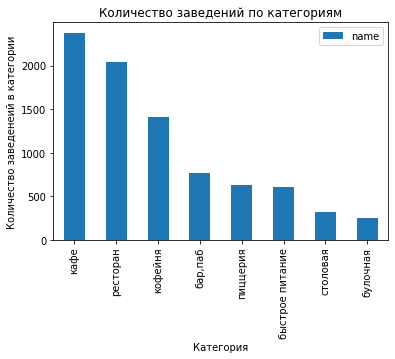

In [13]:
data_cat.plot(kind='bar')
plt.title('Количество заведений по категориям')
plt.xlabel('Категория')
plt.ylabel('Количество заведенеий в категории')


Топ 3 категорий: Кафе, ресторан, коейня 

**Исследуйте количество посадочных мест в местах по категориям: рестораны, кофейни, пиццерии, бары и так далее.**

In [14]:
data_seats = data.pivot_table(index = 'category', values = 'seats', aggfunc = 'median')
data_seats = data_seats.sort_values(by = 'seats', ascending = False)

Text(0, 0.5, 'Среднее количество мест')

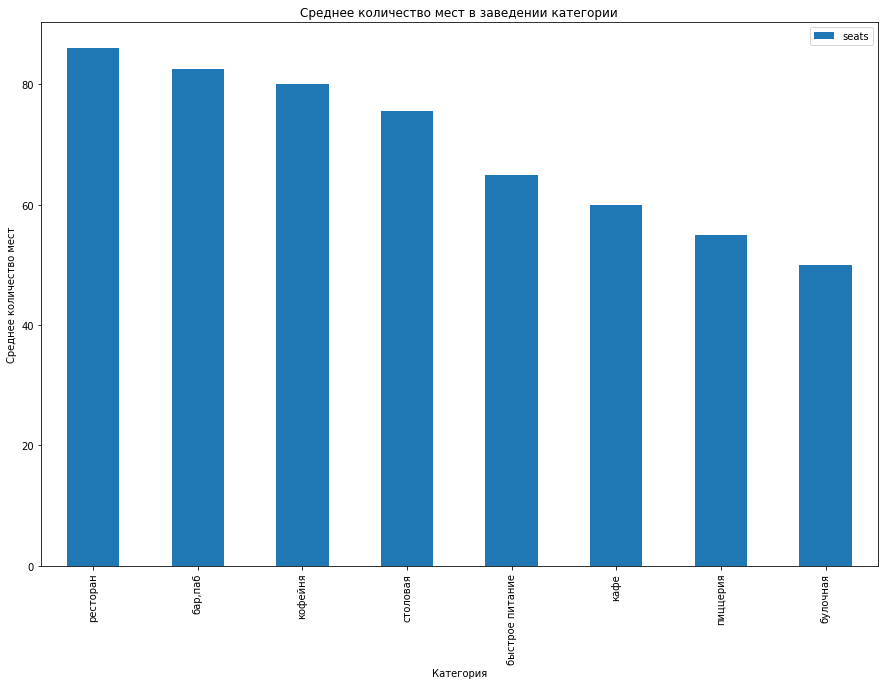

In [15]:
data_seats.plot(kind='bar', figsize = (15, 10))
plt.title('Среднее количество мест в заведении категории')
plt.xlabel('Категория')
plt.ylabel('Среднее количество мест')


Больше посадочных мест наблюдается в тех заведениях, которые направлены на долгое времяпрепровождение в них. Так, больше всего посадочных мест насчитывают рестораны, бары и пабы, а также кофейни. А в пиццериях и булочных организовано меньше всего посадочных мест. 

**Рассмотрите и изобразите соотношение сетевых и несетевых заведений в датасете.**

In [16]:
data_chain = data.pivot_table(index = 'chain', values = 'name', aggfunc = 'count')
data_chain

,name
chain,
0,5200
1,3204


In [17]:
fig = go.Figure(data=[go.Pie(labels=data_chain, values = data_chain['name'], title='Доли сетевых/несетевых заведений от общего количества')])
fig.show() 

#0 — заведение не является сетевым
#1 — заведение является сетевым

In [18]:
data_chain = data.pivot_table(index=['category', 'chain'], values = 'name', aggfunc = 'count').reset_index()
data_chain = data_chain.sort_values(by = 'name', ascending = False)
#0 — заведение не является сетевым
#1 — заведение является сетевым

In [19]:
fig = px.bar(data_chain, x='category', y='name', color='chain', title='Количество сетевых/несетевых заведений по категориям')
fig.update_xaxes(tickangle=45)
fig.show() 

Несетевых заведений гораздо больше, чем сетевых. Сетевых заведений больше лишь у категорий "кофейня", "пиццерия" и "булочная".

**Какие категории заведений чаще являются сетевыми? Исследуйте данные и ответьте на вопрос графиком.**

In [20]:
data_new = data.query('chain > 0')
data_new
#выделим только сетевые заведения 

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
4,иль марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0,Правобережная улица,False
13,буханка,булочная,"Москва, Базовская улица, 15, корп. 1",Северный административный округ,"ежедневно, 08:00–22:00",55.877007,37.504980,4.8,NaN,NaN,NaN,NaN,1,180.0,Базовская улица,False
19,пекарня,булочная,"Москва, Ижорский проезд, 5",Северный административный округ,"ежедневно, круглосуточно",55.887969,37.515688,4.4,NaN,NaN,NaN,NaN,1,NaN,Ижорский проезд,True
20,чебуреки манты,кафе,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.880287,37.448646,4.3,NaN,NaN,NaN,NaN,1,148.0,Правобережная улица,False
23,буханка,булочная,"Москва, Лобненская улица, 13к2",Северный административный округ,"ежедневно, 08:00–22:00",55.888421,37.527106,4.7,NaN,NaN,NaN,NaN,1,NaN,Лобненская улица,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8317,беседка,кафе,"Москва, Кузьминская улица, 10",Юго-Восточный административный округ,"ежедневно, 11:00–23:00",55.690691,37.787735,4.1,NaN,NaN,NaN,NaN,1,NaN,Кузьминская улица,False
8340,семейный очаг,ресторан,"Москва, Шоссейная улица, 13",Юго-Восточный административный округ,"ежедневно, 12:00–00:00",55.688104,37.725197,4.3,средние,Средний счёт:до 1000 ₽,1000.0,NaN,1,98.0,Шоссейная улица,False
8372,чайхана sabr,ресторан,"Москва, улица Хлобыстова, 22",Юго-Восточный административный округ,"ежедневно, 10:00–00:00",55.716361,37.813436,3.9,средние,Средний счёт:150–350 ₽,250.0,NaN,1,32.0,улица Хлобыстова,False
8379,лагман хаус,кафе,"Москва, Новороссийская улица, 14, стр. 2",Юго-Восточный административный округ,"ежедневно, 10:00–00:00",55.678772,37.759422,4.3,NaN,NaN,NaN,NaN,1,40.0,Новороссийская улица,False


In [21]:
data_new_2 = data_new.pivot_table(index = ['name', 'category'], values = 'district', aggfunc = 'count').reset_index()
data_new_2 = data_new_2.sort_values(by = 'district', ascending = False).head(15)
data_new_2.columns = ['name', 'category', 'count']
data_new_2

,name,category,count
1126,шоколадница,кофейня,119
496,домино'с пицца,пиццерия,76
489,додо пицца,пиццерия,74
205,one price coffee,кофейня,71
1142,яндекс лавка,ресторан,69
72,cofix,кофейня,65
241,prime,ресторан,49
617,кофепорт,кофейня,42
632,кулинарная лавка братьев караваевых,кафе,39
963,теремок,ресторан,36


In [22]:
fig = px.bar(data_new_2, x='name', y='count', color='category', title='Количество заведений сети')
fig.update_xaxes(tickangle=45)
fig.show() 

Самые популярные заведения - это кофейня Шоколадница, а также пиццерии Доминос Пицца и Додо Пицца

**Какие административные районы Москвы присутствуют в датасете? Отобразите общее количество заведений и количество заведений каждой категории по районам. Попробуйте проиллюстрировать эту информацию одним графиком.**

In [23]:
data_new_3 = data_new.pivot_table(index = ['category', 'district'], values = 'name', aggfunc = 'count').reset_index()
data_new_3.columns = ['category', 'district', 'count']
data_new_3 = data_new_3.sort_values(by = 'count', ascending = False)
data_new_3

,category,district,count
41,кофейня,Центральный административный округ,221
32,кафе,Центральный административный округ,218
59,ресторан,Центральный административный округ,217
38,кофейня,Северный административный округ,97
37,кофейня,Западный административный округ,93
...,...,...,...
15,булочная,Юго-Восточный административный округ,5
64,столовая,Западный административный округ,4
67,столовая,Северо-Западный административный округ,3
69,столовая,Юго-Восточный административный округ,3


In [24]:
fig = px.bar(data_new_3, x='district', y='count', color='category', title='Количество заведений сети в районе')
fig.update_xaxes(tickangle=45)
fig.show()

In [25]:
data_new_4 = data_new.pivot_table(index = 'district', values = 'name', aggfunc = 'count').reset_index()
data_new_4 = data_new_4.sort_values(by = 'district', ascending = False)
data_new_4

,district,name
8,Южный административный округ,312
7,Юго-Западный административный округ,302
6,Юго-Восточный административный округ,220
5,Центральный административный округ,875
4,Северо-Западный административный округ,156
3,Северо-Восточный административный округ,334
2,Северный административный округ,346
1,Западный административный округ,376
0,Восточный административный округ,283


In [26]:
fig = go.Figure(data=[go.Pie(labels=data_new_4, values=data_new_4['name'], title = 'Доля заведений сети по округам')])
fig.show() 

Почти 30% заведений сосредоточены в Центральном административном округе. Меньше всего заведений - в Северо-Западном административном округе

**Визуализируйте распределение средних рейтингов по категориям заведений. Сильно ли различаются усреднённые рейтинги в разных типах общепита?**

In [27]:
data.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
0,wowфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN,улица Дыбенко,False
1,четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0,улица Дыбенко,False
2,хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0,Клязьминская улица,False
3,dormouse coffee shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN,улица Маршала Федоренко,False
4,иль марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0,Правобережная улица,False


In [28]:
data_rat = data.pivot_table(index = 'category', values = 'rating', aggfunc = 'mean').reset_index()
data_rat = data_rat.sort_values(by = 'rating', ascending = False)


<AxesSubplot:title={'center':'Средние рейтинги по категориям заведений'}, xlabel='category'>

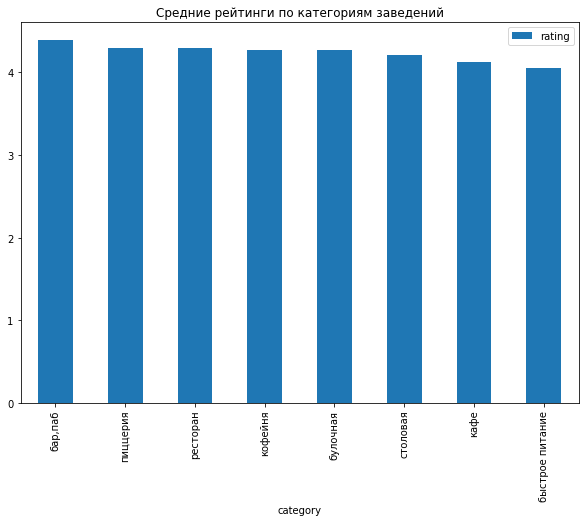

In [29]:
data_rat.plot(kind = 'bar', x = 'category', y = 'rating', figsize = (10, 7), title = 'Средние рейтинги по категориям заведений')

Совсем незначительные различия

**Постройте фоновую картограмму (хороплет) со средним рейтингом заведений каждого района.** 

In [30]:
data_rat_pivot = data.pivot_table(index = 'district', values = 'rating', aggfunc = 'mean').reset_index()
data_rat_pivot

,district,rating
0,Восточный административный округ,4.174185
1,Западный административный округ,4.181551
2,Северный административный округ,4.239866
3,Северо-Восточный административный округ,4.148260
4,Северо-Западный административный округ,4.208802
5,Центральный административный округ,4.377520
6,Юго-Восточный административный округ,4.101120
7,Юго-Западный административный округ,4.172920
8,Южный административный округ,4.184417


In [31]:
from folium import Map, Choropleth

state_geo = '/datasets/admin_level_geomap.geojson' 
moscow_lat, moscow_lng = 55.751244, 37.618423

m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)


Choropleth(
    geo_data=state_geo,
    data=data_rat_pivot,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.5,
    legend_name='Средний рейтинг заведений каждого района Москвы',
).add_to(m)


m

Самые большие рейтинги наблюдаются у заведений, находящихся в Центральном административном округе.

**Отобразите все заведения датасета на карте с помощью кластеров**

In [32]:

from folium import Map, Marker
from folium.plugins import MarkerCluster

moscow_lat, moscow_lng = 55.751244, 37.618423


m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

marker_cluster = MarkerCluster().add_to(m)


def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)


data.apply(create_clusters, axis=1)


m

**Найдите топ-15 улиц по количеству заведений.**

In [33]:
data_street = data.pivot_table(index = 'street', values = 'name', aggfunc = 'count').reset_index()
data_street = data_street.sort_values(by = 'name', ascending = False)
data_street_15 = data_street.head(15)
data_street_15

,street,name
1090,проспект Мира,184
773,Профсоюзная улица,122
1087,проспект Вернадского,108
525,Ленинский проспект,107
523,Ленинградский проспект,95
373,Дмитровское шоссе,88
455,Каширское шоссе,77
298,Варшавское шоссе,76
524,Ленинградское шоссе,70
550,МКАД,65


In [34]:
fig = px.bar(data_street_15, x='street', y='name', title='Количество заведений по улицам')
fig.update_xaxes(tickangle=45)
fig.show() 

In [35]:
data_street_cat = data.pivot_table(index = ['street', 'category'], values = 'name', aggfunc = 'count').reset_index()
data_street_cat.sort_values(by = 'name', ascending = False)

,street,category,name
2860,проспект Мира,кафе,53
2863,проспект Мира,ресторан,45
1380,МКАД,кафе,45
2861,проспект Мира,кофейня,36
1989,Профсоюзная улица,кафе,35
...,...,...,...
1531,Моховая улица,"бар,паб",1
1533,Мукомольный проезд,булочная,1
1534,Мукомольный проезд,быстрое питание,1
1535,Мукомольный проезд,пиццерия,1


In [36]:
data_street_cat = data_street_cat.sort_values(by = 'name', ascending = False)
fig = px.bar(data_street_cat, x='street', y='name', color = 'category', title='Количество заведений по улицам')
fig.update_xaxes(tickangle=45)
fig.show() 

**Найдите улицы, на которых находится только один объект общепита.**

In [37]:
data_street_on = data.pivot_table(index = ['category', 'street', 'rating', 'chain'], values = 'name', aggfunc = 'count').reset_index()
data_street_on.columns = ['category', 'street', 'rating', 'chain', 'count']
data_street_on

,category,street,rating,chain,count
0,"бар,паб",1-й Голутвинский переулок,4.1,0,1
1,"бар,паб",1-й Грайвороновский проезд,3.9,0,1
2,"бар,паб",1-й Красногвардейский проезд,4.4,0,1
3,"бар,паб",1-й Нагатинский проезд,4.4,0,1
4,"бар,паб",1-й Тверской-Ямской переулок,4.4,0,1
...,...,...,...,...,...
7404,столовая,улица Шаболовка,4.6,0,2
7405,столовая,улица Шумкина,4.4,1,1
7406,столовая,улица Щепкина,4.0,0,1
7407,столовая,улица Щепкина,4.2,1,1


In [38]:
data_street_one = data_street_on.query('count == 1')

In [39]:
data_street_one

,category,street,rating,chain,count
0,"бар,паб",1-й Голутвинский переулок,4.1,0,1
1,"бар,паб",1-й Грайвороновский проезд,3.9,0,1
2,"бар,паб",1-й Красногвардейский проезд,4.4,0,1
3,"бар,паб",1-й Нагатинский проезд,4.4,0,1
4,"бар,паб",1-й Тверской-Ямской переулок,4.4,0,1
...,...,...,...,...,...
7403,столовая,улица Шаболовка,4.3,0,1
7405,столовая,улица Шумкина,4.4,1,1
7406,столовая,улица Щепкина,4.0,0,1
7407,столовая,улица Щепкина,4.2,1,1


In [40]:
data_street_one['rating'].mean()

4.213522012578617

In [41]:
data_not_one = data_street_on.query('count > 1')
data_not_one['rating'].mean()

4.290424076607388

У единичных заведеений в среднем рейтинг слегка ниже, чем у сетевых

**Посчитайте медиану этого столбца для каждого района. Используйте это значение в качестве ценового индикатора района. Постройте фоновую картограмму (хороплет) с полученными значениями для каждого района. Проанализируйте цены в центральном административном округе и других**

In [42]:
data_cost = data.pivot_table(index = 'district', values = 'middle_avg_bill', aggfunc = 'median').reset_index()
data_cost

,district,middle_avg_bill
0,Восточный административный округ,575.0
1,Западный административный округ,1000.0
2,Северный административный округ,650.0
3,Северо-Восточный административный округ,500.0
4,Северо-Западный административный округ,700.0
5,Центральный административный округ,1000.0
6,Юго-Восточный административный округ,450.0
7,Юго-Западный административный округ,600.0
8,Южный административный округ,500.0


In [43]:
state_geo = '/datasets/admin_level_geomap.geojson' 
moscow_lat, moscow_lng = 55.751244, 37.618423


m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)


Choropleth(
    geo_data=state_geo,
    data=data_cost,
    columns=['district', 'middle_avg_bill'],
    key_on='feature.name',
    fill_color='YlOrBr',
    fill_opacity=0.7,
    legend_name='Средний чек заведений каждого района Москвы',
).add_to(m)


m

Самые дорогие заведения Москвы сосредоточены в Центральном и Западном административныз округах. Это объясняется пристижностью этих районов.

**Соберите наблюдения по вопросам выше в один общий вывод**

В датасете представлено 8 категорий заведенеий (кафе, ресторан, кофейня, пиццерия, 'бар,паб', быстрое питание, булочная, столовая). Самые популярные заведения - это кафе, рестораны и кофейни.
Больше посадочных мест наблюдается в тех заведениях, которые направлены на долгое времяпрепровождение в них. Так, больше всего посадочных мест насчитывают рестораны, бары и пабы, а также кофейни. А в пиццериях и булочных организовано меньше всего посадочных мест.
В датасете 62% заведений являются сетевыми.
Самые популярные сети заведений - это кофейня Шоколадница, а также пиццерии Доминос Пицца и Додо Пицца.
Заведения распределены в 9 административных районах Москвы. Чуть меньше 30% сетевых заведений сосредоточены в Центральном административном округе.
В среднем самые высокие рейтинги - у баров,пабов, а наиболее низкие - у заведений быстрого питания.
Самые большие рейтинги наблюдаются у заведений, находщихся в Центральном административном округе.
Самая популярная улица для расположения заведений - это Проспект Мира.
Самые большие средние чеки наблюдаются в Центральном и Западном административныз округах.

# Открытие кофейни

In [44]:
data_coffee = data.loc[data['category'] == 'кофейня'].reset_index()
data_coffee

,index,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
0,3,dormouse coffee shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN,улица Маршала Федоренко,False
1,25,в парке вкуснее,кофейня,"Москва, парк Левобережный",Северный административный округ,"ежедневно, 10:00–21:00",55.878453,37.460028,4.3,NaN,NaN,NaN,NaN,1,NaN,парк Левобережный,False
2,45,9 bar coffee,кофейня,"Москва, Коровинское шоссе, 41, стр. 1",Северный административный округ,пн-пт 08:00–18:00,55.885837,37.513422,4.0,NaN,NaN,NaN,NaN,1,46.0,Коровинское шоссе,False
3,46,cofefest,кофейня,"Москва, улица Маршала Федоренко, 6с1",Северный административный округ,пн-пт 09:00–19:00,55.879934,37.492522,3.6,NaN,NaN,NaN,NaN,1,NaN,улица Маршала Федоренко,False
4,52,cofix,кофейня,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 08:00–22:00",55.878531,37.479395,3.8,NaN,NaN,NaN,NaN,1,NaN,улица Дыбенко,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1408,8356,назис пури,кофейня,"Москва, Люблинская улица, 61",Юго-Восточный административный округ,"ежедневно, 09:00–22:00",55.684103,37.738588,4.5,NaN,NaN,NaN,NaN,0,NaN,Люблинская улица,False
1409,8365,квадрат кофе,кофейня,"Москва, Волгоградский проспект, 73, стр. 1",Юго-Восточный административный округ,"пн-пт 08:30–21:30; сб,вс 09:00–21:30",55.709710,37.744450,4.2,NaN,Цена чашки капучино:100–220 ₽,NaN,160.0,0,206.0,Волгоградский проспект,False
1410,8376,шоколад имбирь корица,кофейня,"Москва, Грайвороновская улица, 23",Юго-Восточный административный округ,пн-пт 09:30–19:30,55.721213,37.740755,4.1,NaN,NaN,NaN,NaN,0,NaN,Грайвороновская улица,False
1411,8385,cafio,кофейня,"Москва, Новохохловская улица, 49",Юго-Восточный административный округ,"пн-пт 07:00–22:00; сб,вс 07:00–21:00",55.724357,37.716415,4.7,NaN,Цена чашки капучино:80–120 ₽,NaN,100.0,0,NaN,Новохохловская улица,False


In [45]:
data_coffee.count()

index                1413
name                 1413
category             1413
address              1413
district             1413
hours                1398
lat                  1413
lng                  1413
rating               1413
price                 476
avg_bill              721
middle_avg_bill       200
middle_coffee_cup     521
chain                1413
seats                 751
street               1413
is_24/7              1413
dtype: int64

В датасете представлено 1413 кофеен

In [46]:
data_coffee_dis = data_coffee.pivot_table(index = 'district', values = 'name', aggfunc = 'count').reset_index()
data_coffee_dis = data_coffee_dis.sort_values(by = 'name', ascending = False)
data_coffee_dis

,district,name
5,Центральный административный округ,428
2,Северный административный округ,193
3,Северо-Восточный административный округ,159
1,Западный административный округ,150
8,Южный административный округ,131
0,Восточный административный округ,105
7,Юго-Западный административный округ,96
6,Юго-Восточный административный округ,89
4,Северо-Западный административный округ,62


Больше всего кофеен состредоточено в Центральном административном округе, меньше всего - в Северо-Западном административном округе

In [47]:
state_geo = '/datasets/admin_level_geomap.geojson' 
moscow_lat, moscow_lng = 55.751244, 37.618423


m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)


Choropleth(
    geo_data=state_geo,
    data=data_coffee_dis,
    columns=['district', 'name'],
    key_on='feature.name',
    fill_color='YlOrRd',
    fill_opacity=0.7,
    legend_name='Количество кофеен Москвы по административным районам',
).add_to(m)


m

In [48]:


moscow_lat, moscow_lng = 55.751244, 37.618423


m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

marker_cluster = MarkerCluster().add_to(m)


def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)


data_coffee.apply(create_clusters, axis=1)


m

Подавляющее большинство кофеен сосредоточено в центре города. Также примечательно то, что на юге Москвы кофеен меньше, чем на севере города

In [49]:
data_coffee['is_24/7'].nunique()

2

В датасете есть круглосуточные кофейни

Столбец 'is_24/7' принимает только два значения (либо заведение сетевое, либо нет). А раз в столбце присутсвует два значения, то существуют и круглосуточные, и некруглосуточные кофейни

In [50]:
data_cof_hours = data_coffee.pivot_table(index = 'name', values ='is_24/7', aggfunc = 'nunique')
data_cof_hours

,is_24/7
name,
18 грамм,1
2-й этаж,1
2046,1
22 акра кофе&хлеб,1
42 coffee shop,1
...,...
это кофейня,1
этокофе,1
эшторил,1


In [51]:
fig = go.Figure(data=[go.Pie(labels=data_cof_hours, values=data_cof_hours['is_24/7'], title = 'Доля круглосуточных заведений')])
fig.show() 

In [52]:
#1-некруглосуточные кофейни
#2-круглосуточные кофейни

In [53]:
data_coffee_cup = data_coffee.pivot_table(index = 'district', values = ['middle_coffee_cup', 'rating'], aggfunc = 'mean').reset_index()
data_coffee_cup = data_coffee_cup.sort_values(by = ['middle_coffee_cup', 'rating'], ascending = False)
data_coffee_cup

,district,middle_coffee_cup,rating
1,Западный административный округ,189.938776,4.195333
5,Центральный административный округ,187.518519,4.336449
7,Юго-Западный административный округ,184.176471,4.283333
0,Восточный административный округ,174.023810,4.282857
2,Северный административный округ,165.789474,4.291710
4,Северо-Западный административный округ,165.523810,4.325806
3,Северо-Восточный административный округ,165.333333,4.216981
8,Южный административный округ,158.488372,4.232824
6,Юго-Восточный административный округ,151.088235,4.225843


В зависимости от района чашка копучино имеет разную цену

In [54]:

state_geo = '/datasets/admin_level_geomap.geojson' 
moscow_lat, moscow_lng = 55.751244, 37.618423


m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)


Choropleth(
    geo_data=state_geo,
    data=data_coffee_cup,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='YlGnBu',
    fill_opacity=0.8,
    legend_name='Средний рейтинг заведений каждого района Москвы',
).add_to(m)


m

Наиболее высокие рейтинги наблюдаются в Центральном Административном округе и Северо-Западном Административном округе. Наиболее низкие рейтинги кофеен - в Западном и Северно-Восточном Административных округах.

In [55]:
# средняя цена чашки капучино
state_geo = '/datasets/admin_level_geomap.geojson' 
moscow_lat, moscow_lng = 55.751244, 37.618423


m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)


Choropleth(
    geo_data=state_geo,
    data=data_coffee_cup,
    columns=['district', 'middle_coffee_cup'],
    key_on='feature.name',
    fill_color='YlGnBu',
    fill_opacity=0.8,
    legend_name='Средняя цена кружки капучино каждого района Москвы',
).add_to(m)


m

Презентация: <https://disk.yandex.ru/i/K5Qi110dXiJY8w> 